In [1]:
import os
import matplotlib.pyplot as plt
import numpy as np
import mrcfile
import torch

from tomoSegmentPipeline.utils.common import read_array, write_array
from tomoSegmentPipeline.utils import setup
# from cryoS2Sdrop.dataloader import singleCET_dataset, singleCET_FourierDataset
from cryoS2Sdrop.deconvolution import tom_deconv_tomo

import tomopy.sim.project as proj
from tomopy.recon.algorithm import recon
import matplotlib.pyplot as plt

PARENT_PATH = setup.PARENT_PATH

%matplotlib inline
%config Completer.use_jedi = False
%load_ext autoreload
%autoreload 2

plt.rcParams['figure.figsize'] = [12, 8]
plt.rcParams['figure.dpi'] = 80

def standardize(X):
    mean = X.mean()
    std = X.std()
    new_X = (X - mean) / std

    return new_X

def clip(X, low=0.005, high=0.995):
    # works with tensors =)
    return np.clip(X, np.quantile(X, low), np.quantile(X, high))

/home/ubuntu/Thesis/miniconda3/envs/jero/lib/python3.9/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
# cet_path = os.path.join(PARENT_PATH, 'data/S2SDenoising/dummy_tomograms/tomo02_dummy.mrc')
cet_path = os.path.join(PARENT_PATH, 'data/S2SDenoising/dummy_tomograms/tomoPhantom_model14_noisyGaussPoiss.mrc')
tomo_data = read_array(cet_path)
tomo_data = standardize(clip(tomo_data))
tomo_shape = np.array(tomo_data.shape)
tomo_shape

array([256, 256, 256])

# Compare two reconstructions for independence

In [144]:
n_angles = 300

angles0 = np.linspace(0,2*np.pi,n_angles)
projection0 = proj.project(tomo_data, angles0)

shift = np.pi/np.sqrt(2)
angles1 = np.linspace(shift,2*np.pi+shift,n_angles)
projection1 = proj.project(tomo_data, angles1)

projection0.shape

(300, 232, 660)

In [77]:
reconstruction0 = recon(projection0, angles0, algorithm='fbp')
reconstruction1 = recon(projection1, angles1, algorithm='fbp')

_shape = np.array(reconstruction0.shape)
s0 = (_shape-tomo_shape)//2
s1 = _shape-s0

reconstruction0 = reconstruction0[s0[0]:s1[0], s0[1]:s1[1], s0[2]:s1[2]]
reconstruction0 = standardize(clip(reconstruction0))
reconstruction1 = reconstruction1[s0[0]:s1[0], s0[1]:s1[1], s0[2]:s1[2]]
reconstruction1 = standardize(clip(reconstruction1))

reconstruction0 = tom_deconv_tomo(reconstruction0, 14.08, 0, 1, 1, 0.3, False, 0)
reconstruction1 = tom_deconv_tomo(reconstruction1, 14.08, 0, 1, 1, 0.3, False, 0)

reconstruction0.shape

(232, 464, 464)

(array([ 399383.,  226306.,  331672.,  472875.,  655814.,  885199.,
        1159437., 1470424., 1817385., 2176683., 2529644., 2854496.,
        3128277., 3327842., 3428888., 3440247., 3340633., 3145412.,
        2880015., 2554519., 2197866., 1838967., 1492534., 1175246.,
         898156.,  668894.,  482063.,  337598.,  229971.,  402226.]),
 array([-2.6188169 , -2.444545  , -2.2702732 , -2.0960014 , -1.9217296 ,
        -1.7474577 , -1.5731859 , -1.3989141 , -1.2246422 , -1.0503703 ,
        -0.8760986 , -0.70182675, -0.52755487, -0.35328308, -0.17901124,
        -0.0047394 ,  0.16953243,  0.34380427,  0.51807606,  0.69234794,
         0.86661977,  1.0408915 ,  1.2151634 ,  1.3894353 ,  1.5637071 ,
         1.7379789 ,  1.9122508 ,  2.0865226 ,  2.2607944 ,  2.4350662 ,
         2.609338  ], dtype=float32),
 <BarContainer object of 30 artists>)

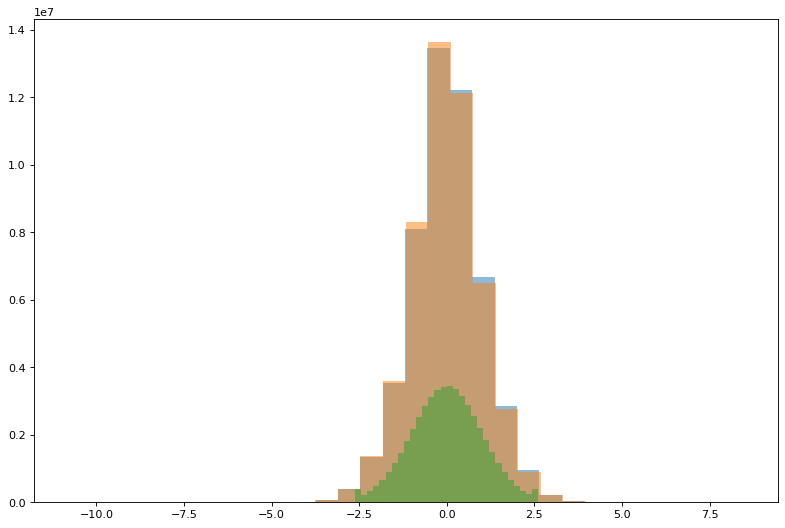

In [81]:
plt.hist(reconstruction0.flatten(), alpha=0.5, bins=30)
plt.hist(reconstruction1.flatten(), alpha=0.5, bins=30)
plt.hist(tomo_data.flatten(), alpha=0.5, bins=30)

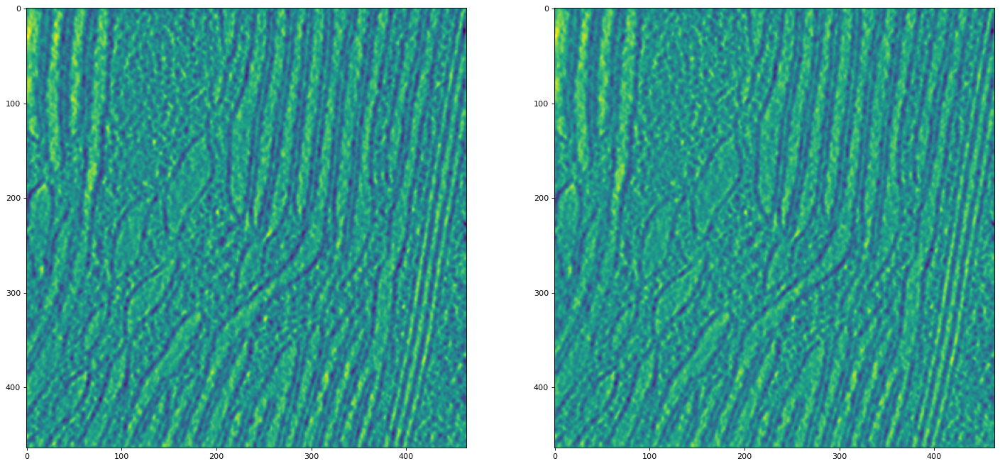

In [79]:
fig, (ax0, ax1) = plt.subplots(1, 2, figsize=(22, 12))

ax0.imshow(reconstruction0[tomo_shape[0]//2])
ax1.imshow(reconstruction1[tomo_shape[0]//2])

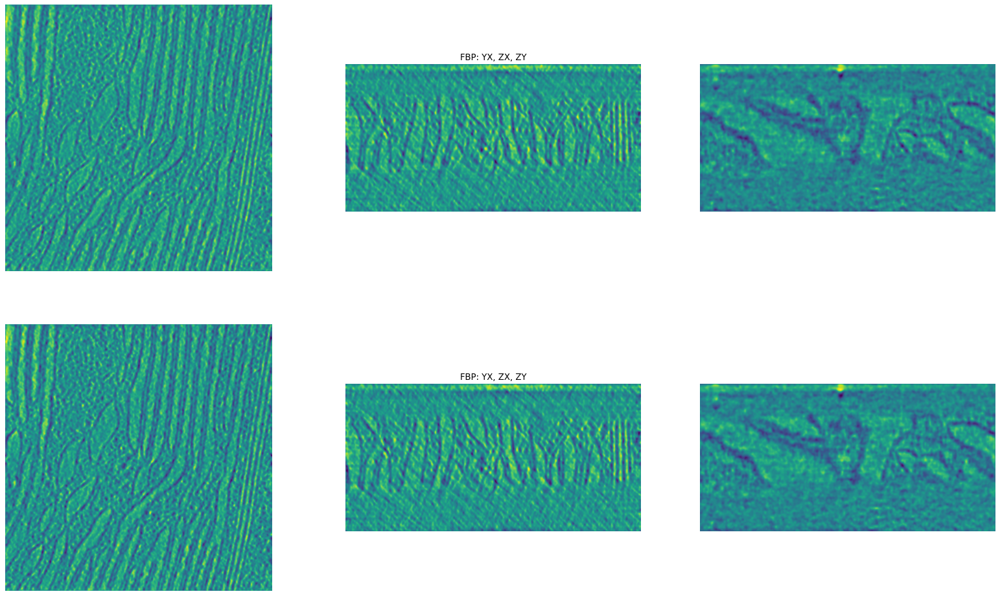

In [80]:
fig, (ax0, ax1) = plt.subplots(2, 3, figsize=(25, 15))
list(map(lambda axi: axi.set_axis_off(), np.array([ax0, ax1]).ravel()))
zidx, yidx, xidx = tomo_shape//2

# ax0[1].set_title("Original: YX, ZX, ZY")
# ax0[0].imshow(tomo_data[zidx])
# ax0[1].imshow(tomo_data[:, yidx, :])
# ax0[2].imshow(tomo_data[:, :, xidx])
ax0[1].set_title("FBP: YX, ZX, ZY")
ax0[0].imshow(reconstruction1[zidx])
ax0[1].imshow(reconstruction1[:, yidx, :])
ax0[2].imshow(reconstruction1[:, :, xidx])

ax1[1].set_title("FBP: YX, ZX, ZY")
ax1[0].imshow(reconstruction0[zidx])
ax1[1].imshow(reconstruction0[:, yidx, :])
ax1[2].imshow(reconstruction0[:, :, xidx])

# CTF correction idea

In [3]:
n_angles = 300

angles0 = np.linspace(0,2*np.pi,n_angles)
projection0 = proj.project(tomo_data, angles0)
print('projection shape:', projection0.shape)

reconstruction0 = recon(projection0, angles0, algorithm='fbp')

_shape = np.array(reconstruction0.shape)
s0 = (_shape-tomo_shape)//2
s1 = _shape-s0

reconstruction0 = reconstruction0[s0[0]:s1[0], s0[1]:s1[1], s0[2]:s1[2]]
reconstruction0 = standardize(clip(reconstruction0))

reconstruction0.shape

projection shape: (300, 256, 366)


(256, 256, 256)

In [20]:
deconv_recon0 = tom_deconv_tomo(reconstruction0, 14, 0, 1, 1, 0.1, False, 0)

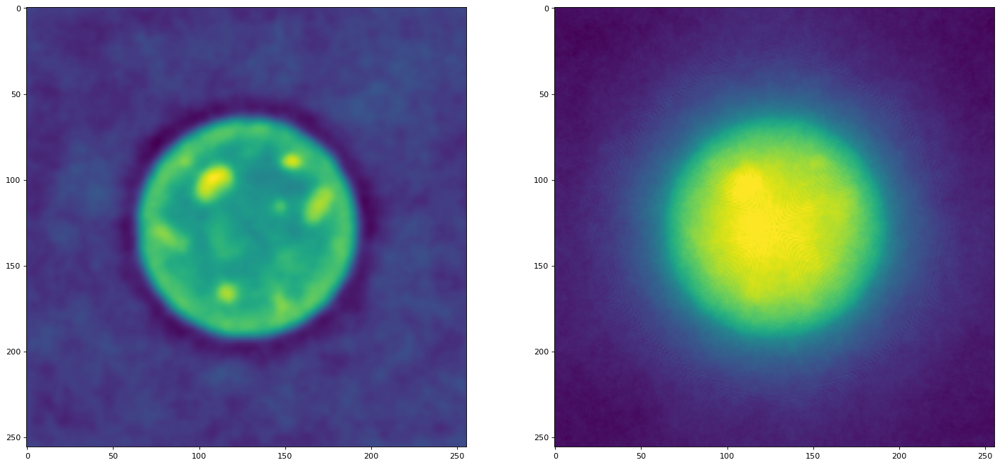

In [21]:
fig, (ax0, ax1) = plt.subplots(1, 2, figsize=(22, 12))

ax0.imshow(deconv_recon0[tomo_shape[0]//2])
ax1.imshow(reconstruction0[tomo_shape[0]//2])

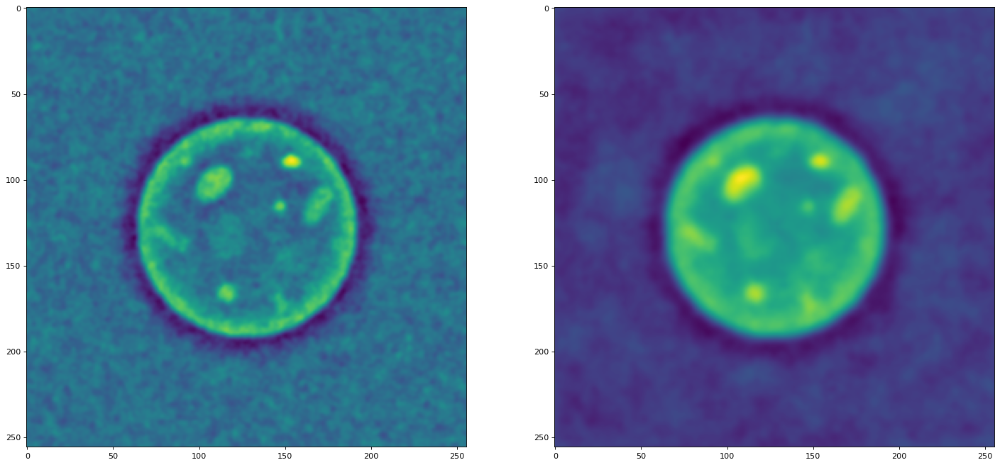

In [22]:
filtered_data = tom_deconv_tomo(tomo_data, 14.08, 0, 1, 1, 0.1, False, 0)

fig, (ax0, ax1) = plt.subplots(1, 2, figsize=(22, 12))

ax0.imshow(filtered_data[tomo_shape[0]//2])
ax1.imshow(deconv_recon0[tomo_shape[0]//2])

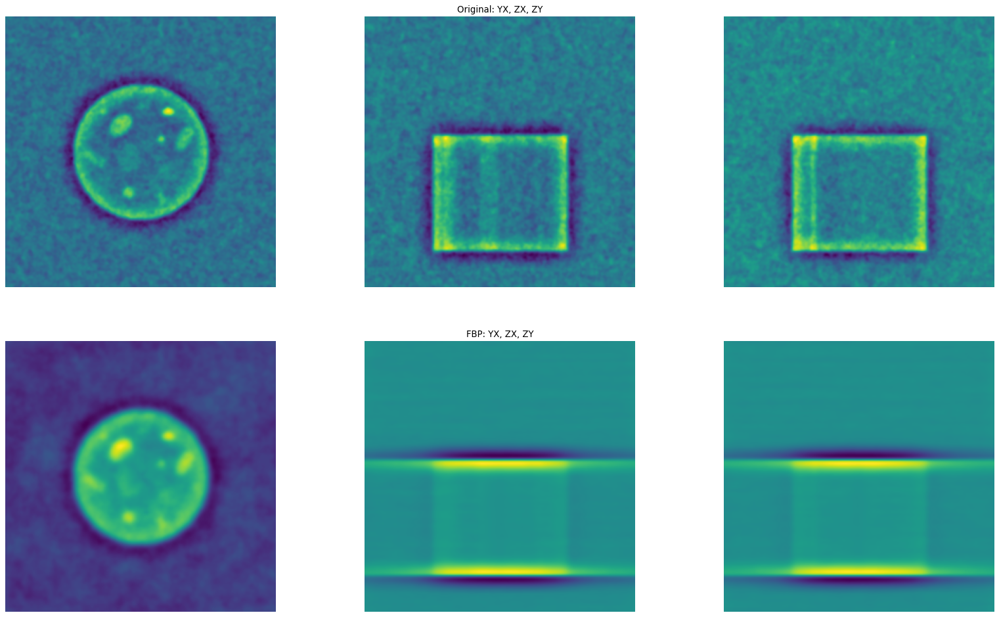

In [23]:
fig, (ax0, ax1) = plt.subplots(2, 3, figsize=(25, 15))
list(map(lambda axi: axi.set_axis_off(), np.array([ax0, ax1]).ravel()))
zidx, yidx, xidx = tomo_shape//2

ax0[1].set_title("Original: YX, ZX, ZY")
ax0[0].imshow(filtered_data[zidx])
ax0[1].imshow(filtered_data[:, yidx, :])
ax0[2].imshow(filtered_data[:, :, xidx])
# ax0[1].set_title("FBP: YX, ZX, ZY")
# ax0[0].imshow(reconstruction0[zidx])
# ax0[1].imshow(reconstruction0[:, yidx, :])
# ax0[2].imshow(reconstruction0[:, :, xidx])

ax1[1].set_title("FBP: YX, ZX, ZY")
ax1[0].imshow(deconv_recon0[zidx])
ax1[1].imshow(deconv_recon0[:, yidx, :])
ax1[2].imshow(deconv_recon0[:, :, xidx])

(array([1.0272000e+04, 2.2827000e+04, 2.4375000e+04, 2.5535000e+04,
        3.7053000e+04, 4.2781000e+04, 4.7945000e+04, 6.5067000e+04,
        9.6700000e+04, 1.6160900e+05, 3.0110600e+05, 3.6888200e+05,
        3.6975000e+05, 1.0668420e+06, 1.1323619e+07, 1.1821390e+06,
        4.5884500e+05, 3.8422300e+05, 3.0099800e+05, 1.4273500e+05,
        8.1129000e+04, 4.3808000e+04, 3.4806000e+04, 3.6243000e+04,
        3.6394000e+04, 3.0389000e+04, 3.1504000e+04, 2.8465000e+04,
        1.8477000e+04, 2.6980000e+03]),
 array([-6.2458305 , -5.8137016 , -5.3815727 , -4.9494443 , -4.5173154 ,
        -4.0851865 , -3.6530578 , -3.220929  , -2.7888002 , -2.3566713 ,
        -1.9245425 , -1.4924138 , -1.060285  , -0.6281562 , -0.19602741,
         0.23610139,  0.6682302 ,  1.100359  ,  1.5324878 ,  1.9646165 ,
         2.3967454 ,  2.828874  ,  3.261003  ,  3.6931317 ,  4.1252604 ,
         4.5573893 ,  4.989518  ,  5.421647  ,  5.8537755 ,  6.2859044 ,
         6.7180333 ], dtype=float32),
 <BarCon

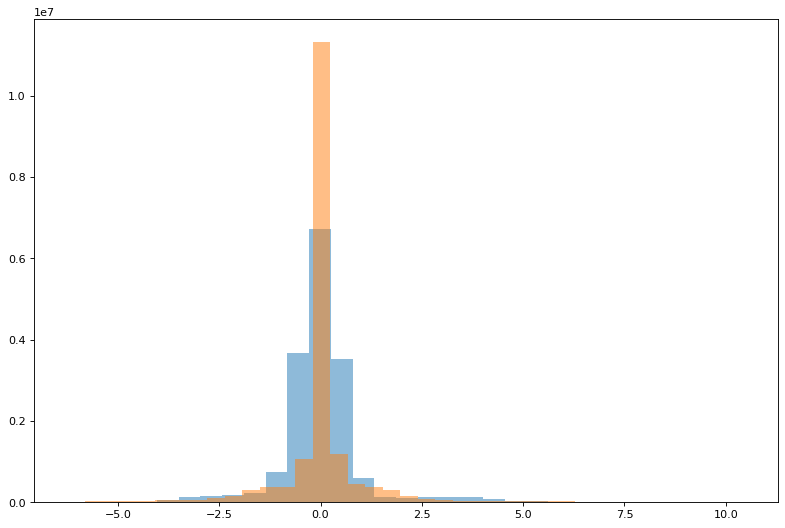

In [24]:
plt.hist(filtered_data.flatten(), alpha=0.5, bins=30)
plt.hist(deconv_recon0.flatten(), alpha=0.5, bins=30)

# Check FFT of reconstruction

In [12]:
fft_recon0 = np.fft.fftshift(np.fft.fftn(deconv_recon0))
logPower_recon0 = np.log(np.abs(fft_recon0)**2)

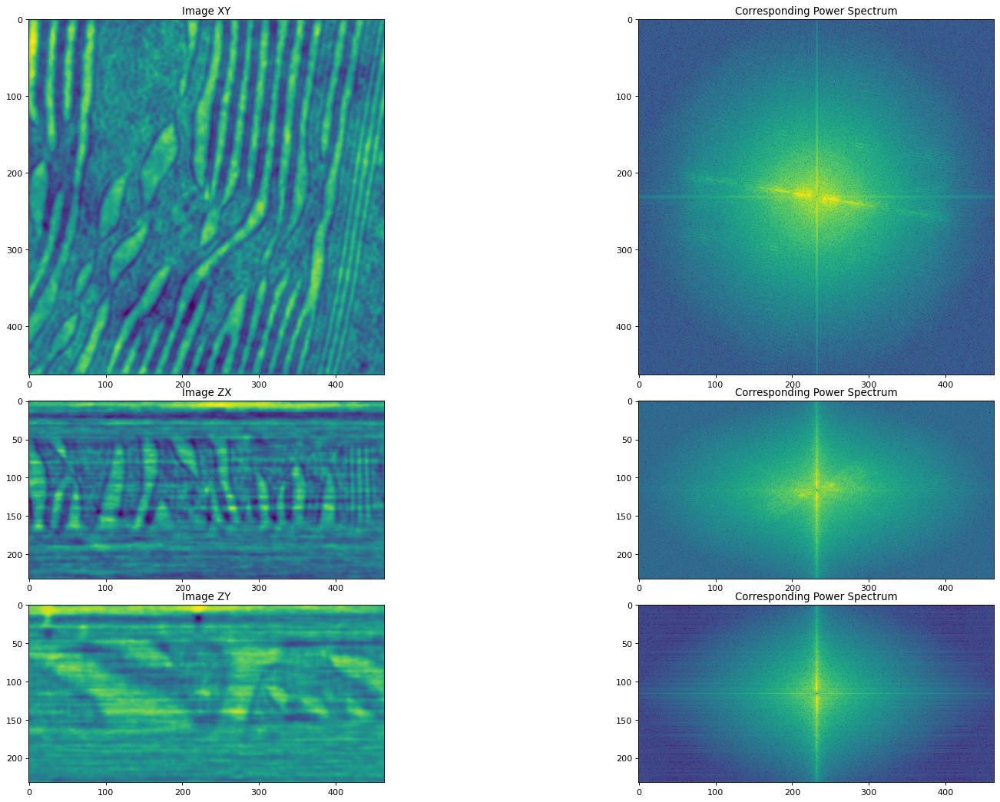

In [13]:
fig, ax = plt.subplots(3, 2, figsize=(20, 13), gridspec_kw={'height_ratios': [2, 1, 1]})  
plt.tight_layout()

ax[0][0].imshow(deconv_recon0[tomo_shape[0]//2])
ax[0][0].set_title('Image XY')

ax[0][1].imshow(logPower_recon0[tomo_shape[0]//2])
ax[0][1].set_title('Corresponding Power Spectrum')

ax[1][0].imshow(deconv_recon0[:, tomo_shape[1]//2, :])
ax[1][0].set_title('Image ZX')

ax[1][1].imshow(logPower_recon0[:, tomo_shape[1]//2, :])
ax[1][1].set_title('Corresponding Power Spectrum')

ax[2][0].imshow(deconv_recon0[:, :, tomo_shape[2]//2])
ax[2][0].set_title('Image ZY')

ax[2][1].imshow(logPower_recon0[:, :, tomo_shape[2]//2])
ax[2][1].set_title('Corresponding Power Spectrum')


plt.show()

In [20]:
fft_data = np.fft.fftshift(np.fft.fftn(tomo_data))
logPower_Fdata = np.log(np.abs(fft_data)**2)

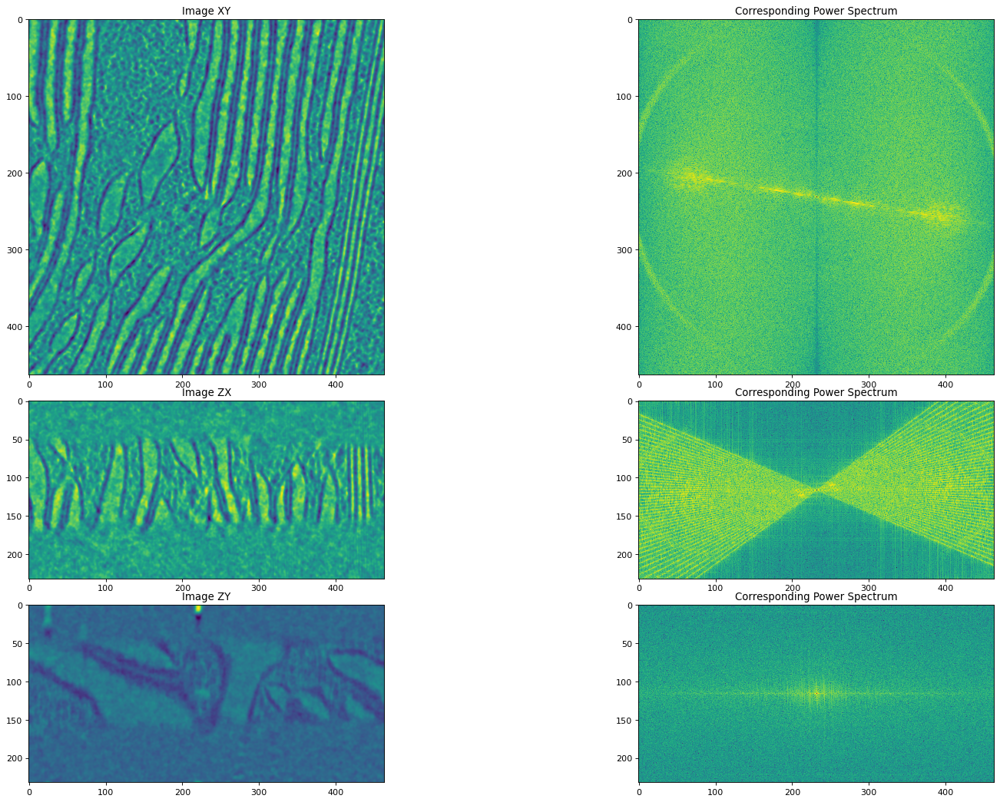

In [21]:
fig, ax = plt.subplots(3, 2, figsize=(20, 13), gridspec_kw={'height_ratios': [2, 1, 1]})  
plt.tight_layout()

ax[0][0].imshow(filtered_data[tomo_shape[0]//2])
ax[0][0].set_title('Image XY')

ax[0][1].imshow(logPower_Fdata[tomo_shape[0]//2])
ax[0][1].set_title('Corresponding Power Spectrum')

ax[1][0].imshow(filtered_data[:, tomo_shape[1]//2, :])
ax[1][0].set_title('Image ZX')

ax[1][1].imshow(logPower_Fdata[:, tomo_shape[1]//2, :])
ax[1][1].set_title('Corresponding Power Spectrum')

ax[2][0].imshow(filtered_data[:, :, tomo_shape[2]//2])
ax[2][0].set_title('Image ZY')

ax[2][1].imshow(logPower_Fdata[:, :, tomo_shape[2]//2])
ax[2][1].set_title('Corresponding Power Spectrum')


plt.show()

In [34]:
filtered_data = tom_deconv_tomo(tomo_data, 14.08, 0, 1, 1, 0.1, False, 0)

fft_data = np.fft.fftshift(np.fft.fftn(tomo_data))
logPower_Fdata = np.abs(fft_data)**2


fft_filtered_data = np.fft.fftshift(np.fft.fftn(filtered_data))
logPower_filtered_Fdata = np.abs(fft_filtered_data)**2

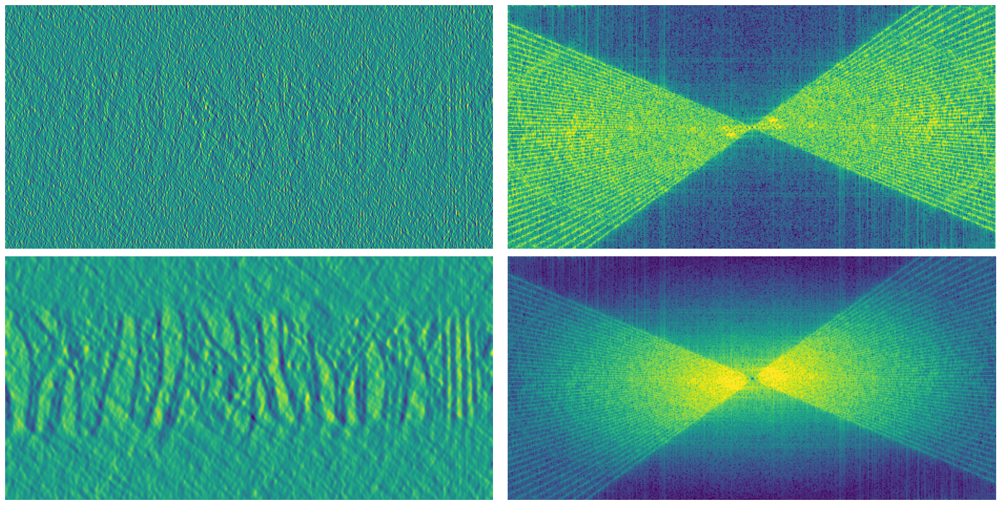

In [38]:
fig, ax = plt.subplots(2, 2, figsize=(20, 10))  
list(map(lambda axi: axi.set_axis_off(), np.array(ax).ravel()))

ax[0][0].imshow(tomo_data[:, tomo_shape[1]//2, :])
# ax[0][0].set_title('Image ZX')

ax[0][1].imshow(np.log(clip(logPower_Fdata[:, tomo_shape[1]//2, :])))
# ax[0][1].set_title('Corresponding Power Spectrum')

ax[1][0].imshow(filtered_data[:, tomo_shape[1]//2, :])
# ax[1][0].set_title('Image ZX')

ax[1][1].imshow(np.log(clip(logPower_filtered_Fdata[:, tomo_shape[1]//2, :])))
# ax[1][1].set_title('Corresponding Power Spectrum')

plt.tight_layout()